# Setup

In [220]:
import torch
from transformers import GPT2LMHeadModel, GPT2Tokenizer, AutoTokenizer
import matplotlib.pyplot as plt
import numpy as np
from dataclasses import dataclass
from transformers import AutoConfig, AutoModelForCausalLM, PreTrainedModel
from safetensors.torch import load_model, save_model, safe_open
from weak_to_strong.model import TransformerWithHead
import seaborn as sns
from sklearn.decomposition import PCA
from datasets import load_dataset
from sklearn.manifold import TSNE
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from scipy.optimize import minimize
from sklearn.utils import gen_batches
from tqdm import tqdm
import torch.nn.functional as F

In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using: " + str(device))

Using: cpu


# Representation Extraction

In [180]:
def get_activation(name, activations):
    """ Helper function to capture the activation at each layer. """
    def hook(model, input, output):
        # We expect 'output' to be a tuple where the first element is the last hidden state
        activations[name] = output[0].detach().to(device)
    return hook

def extract_hidden_states(model, datapoint):
    """ Extract hidden states for all layers of a given model for a specific datapoint. """
    activations = {}
    hooks = []

    # Registering hooks for each layer of the transformer
    for name, module in model.transformer.named_modules():
        if isinstance(module, torch.nn.modules.Module):  # You may want to filter only certain types of layers
            hook = module.register_forward_hook(get_activation(name, activations))
            hooks.append(hook)
    
    datapoint = datapoint.to(device)
    
    # Run the datapoint through the model
    model.eval()
    with torch.no_grad():
        _ = model(datapoint)

    # Remove hooks after use
    for hook in hooks:
        hook.remove()

    return activations

def compare_models(model_name, finetuned_model_path, datapoint): 
    """ Extract and compare hidden states from two models for a given datapoint. """
        # Load both models
    pre_model = TransformerWithHead.from_pretrained(model_name).to(device)
    post_model = TransformerWithHead.from_pretrained(model_name)
    
    load_model(post_model, finetuned_model_path)
    
    post_model = post_model.to(device)
    
    # datapoint = datapoint.to(model1.device)  # Ensure datapoint is on the same device as model
    activations_model1 = extract_hidden_states(pre_model, datapoint)
    activations_model2 = extract_hidden_states(post_model, datapoint)
    
    return activations_model1, activations_model2

def plot_activation_changes(activations_pre, activations_post, layer_name, method='PCA', components=2):
    """
    Visualize changes in activations using PCA or t-SNE.

    Parameters:
    activations_pre (dict): Activations from the model before finetuning.
    activations_post (dict): Activations from the model after finetuning.
    layer_name (str): The layer whose activations are to be visualized.
    method (str): 'PCA' or 't-SNE', the method to use for dimensionality reduction.
    components (int): Number of components for the dimensionality reduction.
    """
    # Extract activations for a specific layer
    data_pre = activations_pre[layer_name].cpu().numpy()
    data_post = activations_post[layer_name].cpu().numpy()
    
    # Check if data is three-dimensional and apply mean pooling if so
    if data_pre.ndim == 3:
        # Mean across the sequence length dimension
        data_pre = data_pre.mean(axis=0)
    if data_post.ndim == 3:
        # Mean across the sequence length dimension
        data_post = data_post.mean(axis=0)
    
    # Concatenate data from both states for unified transformation in PCA/t-SNE
    data_combined = np.concatenate([data_pre, data_post], axis=0)
    
    if method == 'PCA':
        reducer = PCA(n_components=components)
    elif method == 't-SNE':
        reducer = TSNE(n_components=components, learning_rate='auto', init='random')
    else:
        raise ValueError("Unsupported dimensionality reduction method")
    
    # Fit and transform the data
    reduced_data = reducer.fit_transform(data_combined)
    
    # Split the transformed data
    reduced_data_pre = reduced_data[:data_pre.shape[0]]
    reduced_data_post = reduced_data[data_pre.shape[0]:]

    # Plotting
    plt.figure(figsize=(10, 6))
    plt.scatter(reduced_data_pre[:, 0], reduced_data_pre[:, 1], c='blue', alpha=0.5, label='Pre-Finetuning')
    plt.scatter(reduced_data_post[:, 0], reduced_data_post[:, 1], c='red', alpha=0.5, label='Post-Finetuning')
    plt.title(f'Layer: {layer_name} - {method} Visualization')
    plt.xlabel(f'{method} Component 1')
    plt.ylabel(f'{method} Component 2')
    plt.legend()
    plt.show()

def convert_input(text, model_name):
    tokenizer = AutoTokenizer.from_pretrained(model_name) 

    # Tokenize the text and convert to input IDs
    tokens = tokenizer.tokenize(text)
    input_ids = tokenizer.convert_tokens_to_ids(tokens)

    datapoint = torch.tensor([input_ids])
    
    return datapoint

def print_layer_names(activations):
    stor = []
    for key, val in activations.items(): 
        stor.append(key)
        print(key)
    return key

def extract_act_pipeline(model_name, train_data, finetuned_model_path, layer_name = "h.11"): 
    pre_ft_activations = []
    post_ft_activations = []
    print("Converting input to activations.")
    for datapoint in tqdm(train_data):
        activations_model1, activations_model2 = compare_models(model_name, finetuned_model_path, datapoint)
        pre_ft_activations.append(activations_model1[layer_name].squeeze(0))
        post_ft_activations.append(activations_model2[layer_name].squeeze(0))
    print("Activation Loaded.")
    return pre_ft_activations, post_ft_activations




#### SCIPY MINIMIZE

def loss_per_sample(params, lambda_x, lambda_x_tilde, dim):
    A_len = dim**2
    A = params[:A_len].reshape(dim, dim)
    delta = params[A_len:].reshape(dim, 1)
    transformed = lambda_x @ A + delta.T  # Note the transpose to match dimensions
    loss = np.linalg.norm(transformed - lambda_x_tilde, 'fro')**2
    return loss

def loss_function(params, batch_pre_ft, batch_post_ft, dim):
    losses = [loss_per_sample(params, pre_ft, post_ft, dim) for pre_ft, post_ft in zip(batch_pre_ft, batch_post_ft)]
    return np.sum(losses) / len(batch_pre_ft)


def optimize_Adelta(pre_ft_activations, post_ft_activations, batch_size, tol=1e-5, max_iter=10):
    # activation list shape: n_sample * (token_num * feature)
    # A shape: feature * feature
    # delta shape: 1 * feature 
    # batch list shape: batch_size * (token_num * feature)
    dim = pre_ft_activations[0].shape[1]
    print(dim)
    A_len = dim**2
    print(A_len)

    # Initialize A and delta
    A_init = np.eye(dim).flatten()
    delta_init = np.zeros((dim, 1)).flatten()
    initial_params = np.concatenate([A_init, delta_init])

    n_samples = len(pre_ft_activations)
    previous_loss = np.inf
    converged = False

    # Function to perform optimization on a batch
    def optimize_batch(start, end, params):
        batch_pre_ft = pre_ft_activations[start:end]
        batch_post_ft = post_ft_activations[start:end]

        result = minimize(
            fun=loss_function,
            x0=params,
            args=(batch_pre_ft, batch_post_ft, dim),
            method= 'L-BFGS-B'
        )
        return result

    # Iterate over mini-batches and optimize
    for iteration in range(max_iter):
        for batch in gen_batches(n_samples, batch_size):
            result = optimize_batch(batch.start, batch.stop, initial_params)

            if result.success:
                initial_params = result.x
                current_loss = result.fun
                loss_change = previous_loss - current_loss
                previous_loss = current_loss

                print(f"Iteration {iteration}, Batch {batch.start}-{batch.stop}, "
                      f"Current Loss: {current_loss:.6f}, Loss Change: {loss_change:.6f}")

                if np.abs(loss_change) < tol:
                    converged = True
                    break
            else:
                print(f"Optimization failed at Iteration {iteration}, Batch {batch.start}-{batch.stop}.")
                break

        if converged:
            print("Convergence criterion met.")
            break
    else:
        print("Reached maximum iterations without convergence.")

    # After going through all batches, reshape the final parameters back into A and delta
    A_optimized = initial_params[:A_len].reshape(dim, dim)
    delta_optimized = initial_params[A_len:].reshape(dim, 1)
    
    print("Optimization finished.")
    return A_optimized, delta_optimized

def avg_samples(act_list): 
    # Compute the mean along the axis 0 (num_tokens dimension)
    res = []
    for act in act_list: 
        mean_values = torch.mean(act, dim=0)

        result = mean_values.unsqueeze(0)
        res.append(result)
    return np.array(res)

# Representation Predictions [fixed]

In [193]:
def torch_loss_function(A, delta, lambda_x, lambda_x_tilde):
    """
    Computes the loss for a batch of data.

    Args:
    A (torch.Tensor): The affine transformation matrix.
    delta (torch.Tensor): The rank-one update vector.
    lambda_x (torch.Tensor): Pre-finetuning activations (batch).
    lambda_x_tilde (torch.Tensor): Post-finetuning activations (batch).

    Returns:
    torch.Tensor: The computed loss.
    """
    # Compute the affine transformation and add delta
    transformed = torch.mm(lambda_x, A) + delta
    # Calculate the Frobenius norm of the difference, scaled by the number of samples
    loss = torch.norm(transformed - lambda_x_tilde, p='fro') ** 2 / lambda_x.size(0)
    return loss

def optimize_Adelta(pre_ft_activations, post_ft_activations, batch_size, lr=1e-3, tol=1e-5, max_iter=20000):
    """
    Optimizes A and delta parameters using the provided pre and post-finetuning activations.

    Args:
    pre_ft_activations (np.array): Pre-finetuning activations.
    post_ft_activations (np.array): Post-finetuning activations.
    dim (int): The dimensionality of each feature vector.
    batch_size (int): The size of each batch for optimization.
    lr (float): Learning rate for the optimizer.
    tol (float): Tolerance for convergence.
    max_iter (int): Maximum number of iterations.

    Returns:
    Tuple[np.array, np.array]: Optimized A and delta.
    """
    dim = pre_ft_activations[0].shape[1]
    # Convert numpy arrays to torch tensors
    pre_ft_activations_tensor = torch.tensor(pre_ft_activations, dtype=torch.float32)
    post_ft_activations_tensor = torch.tensor(post_ft_activations, dtype=torch.float32)
    
    # Initialize A and delta as torch tensors
    A = nn.Parameter(torch.eye(dim, requires_grad=True))
    delta = nn.Parameter(torch.zeros(1, dim, requires_grad=True))

    # Use the Adam optimizer
    optimizer = optim.Adam([A, delta], lr=lr)

    previous_loss = float('inf')
    for iteration in range(max_iter):
        for i in range(0, len(pre_ft_activations), batch_size):
            optimizer.zero_grad()
            batch_pre_ft = pre_ft_activations_tensor[i:i+batch_size].squeeze(1)
            batch_post_ft = post_ft_activations_tensor[i:i+batch_size].squeeze(1)
#             print(batch_pre_ft.shape)
#             print(batch_post_ft.shape)
            loss = torch_loss_function(A, delta, batch_pre_ft, batch_post_ft)
            loss.backward()
            optimizer.step()

            current_loss = loss.item()
            if iteration % 50 == 0 and i == 0:  # Print the loss for the first batch every 10 iterations
                print(f"Iteration {iteration}, Loss: {current_loss:.6f}")
            
            if abs(previous_loss - current_loss) < tol:
                print("Convergence criterion met.")
                return A.detach().numpy(), delta.detach().numpy()
            previous_loss = current_loss

    print("Optimization finished.")
    return A.detach().numpy(), delta.detach().numpy()

In [194]:
A, d = optimize_Adelta(final_preact, final_postact, batch_size = 256)

Iteration 0, Loss: 280012.656250
Iteration 50, Loss: 40764.394531
Iteration 100, Loss: 35776.003906
Iteration 150, Loss: 34027.992188
Iteration 200, Loss: 33185.078125
Iteration 250, Loss: 32676.558594
Iteration 300, Loss: 32327.652344
Iteration 350, Loss: 32068.455078
Iteration 400, Loss: 31869.582031
Iteration 450, Loss: 31708.992188
Iteration 500, Loss: 31578.876953
Iteration 550, Loss: 31469.896484
Iteration 600, Loss: 31378.708984
Iteration 650, Loss: 31301.398438
Iteration 700, Loss: 31237.041016
Iteration 750, Loss: 31181.515625
Iteration 800, Loss: 31130.384766
Iteration 850, Loss: 31089.740234
Iteration 900, Loss: 31054.800781
Iteration 950, Loss: 31023.386719
Iteration 1000, Loss: 30996.564453
Iteration 1050, Loss: 30974.582031
Iteration 1100, Loss: 30953.988281
Iteration 1150, Loss: 30936.863281
Iteration 1200, Loss: 30922.066406
Iteration 1250, Loss: 30909.074219
Iteration 1300, Loss: 30899.289062
Iteration 1350, Loss: 30889.595703
Iteration 1400, Loss: 30880.785156
Iterati

In [228]:
def new_torch_loss_function(A, delta, lambda_x, lambda_x_tilde):
    """
    Computes the loss for a batch of data.

    Args:
    A (torch.Tensor): The affine transformation matrix.
    delta (torch.Tensor): The rank-one update vector.
    lambda_x (torch.Tensor): Pre-finetuning activations (batch).
    lambda_x_tilde (torch.Tensor): Post-finetuning activations (batch).

    Returns:
    torch.Tensor: The computed loss.
    """
    # Compute the affine transformation and add delta
    transformed = torch.mm(lambda_x, A) + lambda_x * delta
    # Calculate the Frobenius norm of the difference, scaled by the number of samples
    loss = torch.norm(transformed - lambda_x_tilde, p='fro') ** 2 / lambda_x.size(0)
    return loss

def optimize_Adelta_newloss(pre_ft_activations, post_ft_activations, batch_size, lr=1e-3, tol=1e-5, max_iter=20000):
    """
    Optimizes A and delta parameters using the provided pre and post-finetuning activations.

    Args:
    pre_ft_activations (np.array): Pre-finetuning activations.
    post_ft_activations (np.array): Post-finetuning activations.
    dim (int): The dimensionality of each feature vector.
    batch_size (int): The size of each batch for optimization.
    lr (float): Learning rate for the optimizer.
    tol (float): Tolerance for convergence.
    max_iter (int): Maximum number of iterations.

    Returns:
    Tuple[np.array, np.array]: Optimized A and delta.
    """
    dim = pre_ft_activations[0].shape[1]
    # Convert numpy arrays to torch tensors
    pre_ft_activations_tensor = torch.tensor(pre_ft_activations, dtype=torch.float32)
    post_ft_activations_tensor = torch.tensor(post_ft_activations, dtype=torch.float32)
    
    # Initialize A and delta as torch tensors
    A = nn.Parameter(torch.eye(dim, requires_grad=True))
    delta = nn.Parameter(torch.zeros(1, dim, requires_grad=True))

    # Use the Adam optimizer
    optimizer = optim.Adam([A, delta], lr=lr)

    previous_loss = float('inf')
    for iteration in range(max_iter):
        for i in range(0, len(pre_ft_activations), batch_size):
            optimizer.zero_grad()
            batch_pre_ft = pre_ft_activations_tensor[i:i+batch_size].squeeze(1)
            batch_post_ft = post_ft_activations_tensor[i:i+batch_size].squeeze(1)
#             print(batch_pre_ft.shape)
#             print(batch_post_ft.shape)
            loss = new_torch_loss_function(A, delta, batch_pre_ft, batch_post_ft)
            loss.backward()
            optimizer.step()

            current_loss = loss.item()
            if iteration % 50 == 0 and i == 0:  # Print the loss for the first batch every 10 iterations
                print(f"Iteration {iteration}, Loss: {current_loss:.6f}")
            
            if abs(previous_loss - current_loss) < tol:
                print("Convergence criterion met.")
                return A.detach().numpy(), delta.detach().numpy()
            previous_loss = current_loss

    print("Optimization finished.")
    return A.detach().numpy(), delta.detach().numpy()

In [230]:
newA, newd = optimize_Adelta_newloss(final_preact, final_postact, batch_size = 256)

Iteration 0, Loss: 280012.656250
Iteration 50, Loss: 40714.656250
Iteration 100, Loss: 35759.625000
Iteration 150, Loss: 34021.417969
Iteration 200, Loss: 33182.343750
Iteration 250, Loss: 32675.847656
Iteration 300, Loss: 32328.068359
Iteration 350, Loss: 32070.603516
Iteration 400, Loss: 31873.484375
Iteration 450, Loss: 31713.117188
Iteration 500, Loss: 31584.193359
Iteration 550, Loss: 31475.062500
Iteration 600, Loss: 31384.666016
Iteration 650, Loss: 31308.158203
Iteration 700, Loss: 31243.027344
Iteration 750, Loss: 31188.478516
Iteration 800, Loss: 31137.773438
Iteration 850, Loss: 31095.041016
Iteration 900, Loss: 31061.164062
Iteration 950, Loss: 31029.277344
Iteration 1000, Loss: 31002.505859
Iteration 1050, Loss: 30981.285156
Iteration 1100, Loss: 30960.478516
Iteration 1150, Loss: 30943.578125
Iteration 1200, Loss: 30929.380859
Iteration 1250, Loss: 30914.789062
Iteration 1300, Loss: 30907.320312
Iteration 1350, Loss: 30897.031250
Iteration 1400, Loss: 30887.906250
Iterati

# LORA

In [201]:
import torch
import torch.nn as nn
import torch.optim as optim

def torch_loss_function_lora(B, C, delta, lambda_x, lambda_x_tilde):
    """
    Computes the loss for a batch of data using LORA.

    Args:
    B, C (torch.Tensor): Low-rank matrices decomposing A.
    delta (torch.Tensor): The rank-one update vector.
    lambda_x (torch.Tensor): Pre-finetuning activations (batch).
    lambda_x_tilde (torch.Tensor): Post-finetuning activations (batch).

    Returns:
    torch.Tensor: The computed loss.
    """
    A = torch.mm(B, C)  # Reconstruct A from B and C
    transformed = torch.mm(lambda_x, A) + delta
    loss = torch.norm(transformed - lambda_x_tilde, p='fro') ** 2 / lambda_x.size(0)
    return loss

def optimize_lora(pre_ft_activations, post_ft_activations, rank= 3, batch_size=256, lr=1e-3, tol=1e-5, max_iter=10000):
    """
    Optimizes B, C, and delta parameters using LORA.

    Args:
    pre_ft_activations, post_ft_activations (np.array): Activation arrays.
    rank (int): Rank for the low-rank decomposition of A.
    batch_size (int): Batch size for optimization.
    lr (float): Learning rate.
    tol (float): Tolerance for convergence.
    max_iter (int): Max number of iterations.

    Returns:
    Tuple[np.array, np.array, np.array]: Optimized B, C, and delta.
    """
    dim = pre_ft_activations[0].shape[1]
    pre_ft_activations_tensor = torch.tensor(pre_ft_activations, dtype=torch.float32)
    post_ft_activations_tensor = torch.tensor(post_ft_activations, dtype=torch.float32)
    
    B = nn.Parameter(torch.randn(dim, rank, requires_grad=True))
    C = nn.Parameter(torch.randn(rank, dim, requires_grad=True))
    delta = nn.Parameter(torch.zeros(1, dim, requires_grad=True))

    optimizer = optim.Adam([B, C, delta], lr=lr)

    previous_loss = float('inf')
    for iteration in range(max_iter):
        for i in range(0, len(pre_ft_activations), batch_size):
            optimizer.zero_grad()
            batch_pre_ft = pre_ft_activations_tensor[i:i+batch_size].squeeze(1)
            batch_post_ft = post_ft_activations_tensor[i:i+batch_size].squeeze(1)
            loss = torch_loss_function_lora(B, C, delta, batch_pre_ft, batch_post_ft)
            loss.backward()
            optimizer.step()

            current_loss = loss.item()
            if iteration % 50 == 0 and i == 0:
                print(f"Iteration {iteration}, Loss: {current_loss:.6f}")
            
            if abs(previous_loss - current_loss) < tol:
                print("Convergence criterion met.")
                return B.detach().numpy(), C.detach().numpy(), delta.detach().numpy()
            previous_loss = current_loss

    print("Optimization finished.")
    return B.detach().numpy(), C.detach().numpy(), delta.detach().numpy()

In [204]:
B, C, delta = optimize_lora(final_preact, final_postact, max_iter=10000)

Iteration 0, Loss: 431478912.000000
Iteration 10, Loss: 14149198.000000
Iteration 20, Loss: 4165299.250000
Iteration 30, Loss: 3274158.500000
Iteration 40, Loss: 2662343.250000
Iteration 50, Loss: 2190009.000000
Iteration 60, Loss: 1816576.125000
Iteration 70, Loss: 1521462.875000
Iteration 80, Loss: 1288769.250000
Iteration 90, Loss: 1104189.750000
Iteration 100, Loss: 955460.687500
Iteration 110, Loss: 833030.562500
Iteration 120, Loss: 730057.687500
Iteration 130, Loss: 641805.500000
Iteration 140, Loss: 564572.562500
Iteration 150, Loss: 493589.875000
Iteration 160, Loss: 421026.093750
Iteration 170, Loss: 346232.906250
Iteration 180, Loss: 284127.968750
Iteration 190, Loss: 240630.906250
Iteration 200, Loss: 207847.062500
Iteration 210, Loss: 180997.953125
Iteration 220, Loss: 158421.218750
Iteration 230, Loss: 139373.828125
Iteration 240, Loss: 123189.562500
Iteration 250, Loss: 108573.570312
Iteration 260, Loss: 93743.945312
Iteration 270, Loss: 80647.195312
Iteration 280, Loss:

# Ground Truth Linear Probe

In [226]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

def linear_probe(activations, labels):

    X = np.array([(np.array([1]) + act.detach().cpu().numpy()).mean(axis=0) for act in activations])
    y = np.array(labels)

    print(X.shape)
    # Split into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize and train the linear classifier
    clf = LogisticRegression(max_iter=1000)
    clf.fit(X_train, y_train)

    # Predict on the test set
    y_pred = clf.predict(X_test)

    # Calculate the accuracy
    accuracy = accuracy_score(y_test, y_pred)
    print(f'Accuracy: {accuracy:.2f}')
    return clf

def cosine_similarity_torch(vec1, vec2):
    vec1 = torch.tensor(vec1)
    vec2 = torch.tensor(vec2)
    
    similarity = F.cosine_similarity(vec1, vec2)
    
    return similarity

def plot_vecs(weights, d):
    try: 
        weights_np = weights.detach().numpy() if weights.requires_grad else weights.numpy()
        d_np = d.detach().numpy() if d.requires_grad else d.numpy()
    except Exception: 
        weights_np = weights
        d_np = d
    # Stack the vectors for PCA
    data = np.vstack([weights_np, d_np])

    # Initialize PCA to reduce to 2 dimensions
    pca = PCA(n_components=2)
    data_reduced = pca.fit_transform(data)

    # Plot the reduced data
    plt.figure(figsize=(8, 6))
    plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=['red', 'blue'], label=['Weights', 'd'])
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.title('2D Visualization of High-Dimensional Vectors')
    plt.legend()
    plt.grid(True)
    plt.show()

In [209]:
labels = []
for i in tqdm(range(len(post_ft_activations))): 
    labels.append(ds["train"][i]["label"])

100%|███████████████████████████████████████████████████████████████████████████████████| 10000/10000 [00:00<00:00, 16806.46it/s]


In [210]:
clf = linear_probe(post_ft_activations, labels)

(10000, 768)
Accuracy: 0.92


/home/slhleosun/.conda/envs/ai_env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [212]:
weights = clf.coef_

In [214]:
weights.shape

(1, 768)

In [217]:
d.shape

(1, 768)

In [221]:
similarity = cosine_similarity_torch(weights, d)
print("Cosine similarity:", similarity)

Cosine similarity: tensor([0.0102], dtype=torch.float64)


In [222]:
similarity = cosine_similarity_torch(weights, delta)
print("Cosine similarity:", similarity)

Cosine similarity: tensor([-0.0068], dtype=torch.float64)


In [223]:
similarity = cosine_similarity_torch(d, delta)
print("Cosine similarity:", similarity)

Cosine similarity: tensor([0.4624])


In [231]:
similarity = cosine_similarity_torch(weights, newd)
print("Cosine similarity:", similarity)

Cosine similarity: tensor([0.0189], dtype=torch.float64)


In [232]:
similarity = cosine_similarity_torch(delta, newd)
print("Cosine similarity:", similarity)

Cosine similarity: tensor([-0.0014])


In [233]:
similarity = cosine_similarity_torch(d, newd)
print("Cosine similarity:", similarity)

Cosine similarity: tensor([0.0179])


In [235]:
similarity = cosine_similarity_torch(newd, weights)
print("Cosine similarity:", similarity)

Cosine similarity: tensor([0.0189], dtype=torch.float64)


# data prep

In [161]:
A_optimized, delta_optimized = optimize_Adelta(pre_ft_activations, post_ft_activations, 32)

Iteration 0, Batch 0-32, Current Loss: 53661224.000000, Loss Change: inf
Iteration 0, Batch 32-64, Current Loss: 27824694.000000, Loss Change: 25836530.000000
Iteration 0, Batch 64-96, Current Loss: 32458676.000000, Loss Change: -4633982.000000
Iteration 0, Batch 96-128, Current Loss: 33209262.000000, Loss Change: -750586.000000
Iteration 0, Batch 128-160, Current Loss: 26042770.000000, Loss Change: 7166492.000000
Iteration 0, Batch 160-192, Current Loss: 36695872.000000, Loss Change: -10653102.000000
Iteration 0, Batch 192-224, Current Loss: 29319158.000000, Loss Change: 7376714.000000
Iteration 0, Batch 224-256, Current Loss: 42284572.000000, Loss Change: -12965414.000000
Iteration 0, Batch 256-288, Current Loss: 30385680.000000, Loss Change: 11898892.000000
Iteration 0, Batch 288-320, Current Loss: 37505600.000000, Loss Change: -7119920.000000
Iteration 0, Batch 320-352, Current Loss: 40856620.000000, Loss Change: -3351020.000000
Iteration 0, Batch 352-384, Current Loss: 33198764.00

In [158]:
ds = load_dataset("amazon_polarity")

In [159]:
for i in range(10000): 
    entry = ds["train"][i]
    train_dps.append(convert_input(entry['title'] + " " + entry['content'], "gpt2"))
    print(f"Completed {i}")

Completed 1024
Completed 1025
Completed 1026
Completed 1027
Completed 1028
Completed 1029
Completed 1030
Completed 1031
Completed 1032
Completed 1033
Completed 1034
Completed 1035
Completed 1036
Completed 1037
Completed 1038
Completed 1039
Completed 1040
Completed 1041
Completed 1042
Completed 1043
Completed 1044
Completed 1045
Completed 1046
Completed 1047
Completed 1048
Completed 1049
Completed 1050
Completed 1051
Completed 1052
Completed 1053
Completed 1054
Completed 1055
Completed 1056
Completed 1057
Completed 1058
Completed 1059
Completed 1060
Completed 1061
Completed 1062
Completed 1063
Completed 1064
Completed 1065
Completed 1066
Completed 1067
Completed 1068
Completed 1069
Completed 1070
Completed 1071
Completed 1072
Completed 1073
Completed 1074
Completed 1075
Completed 1076
Completed 1077
Completed 1078
Completed 1079
Completed 1080
Completed 1081
Completed 1082
Completed 1083
Completed 1084
Completed 1085
Completed 1086
Completed 1087
Completed 1088
Completed 1089
Completed 

In [160]:
pre_ft_activations, post_ft_activations = extract_act_pipeline("gpt2", train_dps, mp) 

Converting input to activations.


100%|████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [2:28:23<00:00,  1.12it/s]

Activation Loaded.


In [175]:
pre_ft_activations

[tensor([[  0.2646,  -1.3671,  -0.5663,  ...,  -2.3247,   1.2736,  -0.5991],
         [  1.4728,  -4.0334,  -4.4096,  ...,   3.3852,   1.5164,   2.9758],
         [ -2.0511,   0.5876,  -3.0194,  ...,   2.8435,   9.4422,   3.4351],
         ...,
         [  0.2082,  -4.2513,   3.1734,  ...,  -3.3635,  -9.3765,  -0.7559],
         [ -0.6685,  -0.9127,  -3.3707,  ...,   0.4390, -12.9737,   3.8651],
         [  1.0506,  -8.6709,  -4.4781,  ...,  -5.4996,  -7.1755,   0.8218]]),
 tensor([[  0.0505,  -0.1728,  -0.1690,  ...,  -1.0096,   0.1280,  -1.0687],
         [  2.2711,  -3.8670,   1.3570,  ...,   0.3327,  -4.6156,  -1.0954],
         [  0.1060,   3.9959,   1.5504,  ...,   2.5860,  -4.9138,   2.2579],
         ...,
         [  9.2348,  -0.8164,   7.6328,  ...,   8.4112,  -4.3519,   1.1394],
         [ 10.2101,  -3.3905,  -6.6059,  ...,  -4.5737, -12.5228,  -0.4912],
         [  2.6151,  -6.7962,  -2.9658,  ...,  -0.2645,  -9.4484,  -1.1771]]),
 tensor([[  0.2251,   0.0573,  -0.5961,  ...

In [181]:
final_preact = avg_samples(pre_ft_activations)
final_postact = avg_samples(post_ft_activations)

### Usage Example

In [32]:
model_name = 'gpt2-medium'

strong_model_fintuned_path = "/net/scratch/weak_to_strong/weak-to-strong/results/default/bs=32-dn=sciq-e=2-ee=1000000-lp=0-l=xent-l=5e-05-ls=cosi_anne-mc=1024-ms=gpt2-medium-nd=20000-ntd=10000-o=adam-s=0-twd=0-wms=gpt2/model.safetensors"

# activations1, activations2 = compare_models(model_name, strong_model_fintuned_path, test_datapoint)

In [33]:
test_datapoint = convert_input("Summary Changes of state are examples of phase changes, or phase transitions. All phase changes are accompanied by changes in the energy of a system. Changes from a more-ordered state to a less-ordered state (such as a liquid to a gas) areendothermic. Changes from a less-ordered state to a more-ordered state (such as a liquid to a solid) are always exothermic. The conversion of a solid to a liquid is called fusion (or melting). The energy required to melt 1 mol of a substance is its enthalpy of fusion (ΔHfus). The energy change required to vaporize 1 mol of a substance is the enthalpy of vaporization (ΔHvap). The direct conversion of a solid to a gas is sublimation. The amount of energy needed to sublime 1 mol of a substance is its enthalpy of sublimation (ΔHsub) and is the sum of the enthalpies of fusion and vaporization. Plots of the temperature of a substance versus heat added or versus heating time at a constant rate of heating are calledheating curves. Heating curves relate temperature changes to phase transitions. A superheated liquid, a liquid at a temperature and pressure at which it should be a gas, is not stable. A cooling curve is not exactly the reverse of the heating curve because many liquids do not freeze at the expected temperature. Instead, they form a supercooled liquid, a metastable liquid phase that exists below the normal melting point. Supercooled liquids usually crystallize on standing, or adding a seed crystal of the same or another substance can induce crystallization.", model_name)


activations1, activations2 = compare_models(model_name, finetuned_model_path, test_datapoint)

RuntimeError: Error(s) in loading state_dict for TransformerWithHead:
	size mismatch for lm.transformer.wte.weight: copying a param with shape torch.Size([50257, 768]) from checkpoint, the shape in current model is torch.Size([50257, 1024]).
	size mismatch for lm.transformer.wpe.weight: copying a param with shape torch.Size([1024, 768]) from checkpoint, the shape in current model is torch.Size([1024, 1024]).
	size mismatch for lm.transformer.h.0.ln_1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.0.ln_1.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.0.attn.c_attn.weight: copying a param with shape torch.Size([768, 2304]) from checkpoint, the shape in current model is torch.Size([1024, 3072]).
	size mismatch for lm.transformer.h.0.attn.c_attn.bias: copying a param with shape torch.Size([2304]) from checkpoint, the shape in current model is torch.Size([3072]).
	size mismatch for lm.transformer.h.0.attn.c_proj.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 1024]).
	size mismatch for lm.transformer.h.0.attn.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.0.ln_2.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.0.ln_2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.0.mlp.c_fc.weight: copying a param with shape torch.Size([768, 3072]) from checkpoint, the shape in current model is torch.Size([1024, 4096]).
	size mismatch for lm.transformer.h.0.mlp.c_fc.bias: copying a param with shape torch.Size([3072]) from checkpoint, the shape in current model is torch.Size([4096]).
	size mismatch for lm.transformer.h.0.mlp.c_proj.weight: copying a param with shape torch.Size([3072, 768]) from checkpoint, the shape in current model is torch.Size([4096, 1024]).
	size mismatch for lm.transformer.h.0.mlp.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.1.ln_1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.1.ln_1.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.1.attn.c_attn.weight: copying a param with shape torch.Size([768, 2304]) from checkpoint, the shape in current model is torch.Size([1024, 3072]).
	size mismatch for lm.transformer.h.1.attn.c_attn.bias: copying a param with shape torch.Size([2304]) from checkpoint, the shape in current model is torch.Size([3072]).
	size mismatch for lm.transformer.h.1.attn.c_proj.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 1024]).
	size mismatch for lm.transformer.h.1.attn.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.1.ln_2.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.1.ln_2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.1.mlp.c_fc.weight: copying a param with shape torch.Size([768, 3072]) from checkpoint, the shape in current model is torch.Size([1024, 4096]).
	size mismatch for lm.transformer.h.1.mlp.c_fc.bias: copying a param with shape torch.Size([3072]) from checkpoint, the shape in current model is torch.Size([4096]).
	size mismatch for lm.transformer.h.1.mlp.c_proj.weight: copying a param with shape torch.Size([3072, 768]) from checkpoint, the shape in current model is torch.Size([4096, 1024]).
	size mismatch for lm.transformer.h.1.mlp.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.2.ln_1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.2.ln_1.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.2.attn.c_attn.weight: copying a param with shape torch.Size([768, 2304]) from checkpoint, the shape in current model is torch.Size([1024, 3072]).
	size mismatch for lm.transformer.h.2.attn.c_attn.bias: copying a param with shape torch.Size([2304]) from checkpoint, the shape in current model is torch.Size([3072]).
	size mismatch for lm.transformer.h.2.attn.c_proj.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 1024]).
	size mismatch for lm.transformer.h.2.attn.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.2.ln_2.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.2.ln_2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.2.mlp.c_fc.weight: copying a param with shape torch.Size([768, 3072]) from checkpoint, the shape in current model is torch.Size([1024, 4096]).
	size mismatch for lm.transformer.h.2.mlp.c_fc.bias: copying a param with shape torch.Size([3072]) from checkpoint, the shape in current model is torch.Size([4096]).
	size mismatch for lm.transformer.h.2.mlp.c_proj.weight: copying a param with shape torch.Size([3072, 768]) from checkpoint, the shape in current model is torch.Size([4096, 1024]).
	size mismatch for lm.transformer.h.2.mlp.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.3.ln_1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.3.ln_1.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.3.attn.c_attn.weight: copying a param with shape torch.Size([768, 2304]) from checkpoint, the shape in current model is torch.Size([1024, 3072]).
	size mismatch for lm.transformer.h.3.attn.c_attn.bias: copying a param with shape torch.Size([2304]) from checkpoint, the shape in current model is torch.Size([3072]).
	size mismatch for lm.transformer.h.3.attn.c_proj.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 1024]).
	size mismatch for lm.transformer.h.3.attn.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.3.ln_2.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.3.ln_2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.3.mlp.c_fc.weight: copying a param with shape torch.Size([768, 3072]) from checkpoint, the shape in current model is torch.Size([1024, 4096]).
	size mismatch for lm.transformer.h.3.mlp.c_fc.bias: copying a param with shape torch.Size([3072]) from checkpoint, the shape in current model is torch.Size([4096]).
	size mismatch for lm.transformer.h.3.mlp.c_proj.weight: copying a param with shape torch.Size([3072, 768]) from checkpoint, the shape in current model is torch.Size([4096, 1024]).
	size mismatch for lm.transformer.h.3.mlp.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.4.ln_1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.4.ln_1.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.4.attn.c_attn.weight: copying a param with shape torch.Size([768, 2304]) from checkpoint, the shape in current model is torch.Size([1024, 3072]).
	size mismatch for lm.transformer.h.4.attn.c_attn.bias: copying a param with shape torch.Size([2304]) from checkpoint, the shape in current model is torch.Size([3072]).
	size mismatch for lm.transformer.h.4.attn.c_proj.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 1024]).
	size mismatch for lm.transformer.h.4.attn.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.4.ln_2.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.4.ln_2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.4.mlp.c_fc.weight: copying a param with shape torch.Size([768, 3072]) from checkpoint, the shape in current model is torch.Size([1024, 4096]).
	size mismatch for lm.transformer.h.4.mlp.c_fc.bias: copying a param with shape torch.Size([3072]) from checkpoint, the shape in current model is torch.Size([4096]).
	size mismatch for lm.transformer.h.4.mlp.c_proj.weight: copying a param with shape torch.Size([3072, 768]) from checkpoint, the shape in current model is torch.Size([4096, 1024]).
	size mismatch for lm.transformer.h.4.mlp.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.5.ln_1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.5.ln_1.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.5.attn.c_attn.weight: copying a param with shape torch.Size([768, 2304]) from checkpoint, the shape in current model is torch.Size([1024, 3072]).
	size mismatch for lm.transformer.h.5.attn.c_attn.bias: copying a param with shape torch.Size([2304]) from checkpoint, the shape in current model is torch.Size([3072]).
	size mismatch for lm.transformer.h.5.attn.c_proj.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 1024]).
	size mismatch for lm.transformer.h.5.attn.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.5.ln_2.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.5.ln_2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.5.mlp.c_fc.weight: copying a param with shape torch.Size([768, 3072]) from checkpoint, the shape in current model is torch.Size([1024, 4096]).
	size mismatch for lm.transformer.h.5.mlp.c_fc.bias: copying a param with shape torch.Size([3072]) from checkpoint, the shape in current model is torch.Size([4096]).
	size mismatch for lm.transformer.h.5.mlp.c_proj.weight: copying a param with shape torch.Size([3072, 768]) from checkpoint, the shape in current model is torch.Size([4096, 1024]).
	size mismatch for lm.transformer.h.5.mlp.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.6.ln_1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.6.ln_1.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.6.attn.c_attn.weight: copying a param with shape torch.Size([768, 2304]) from checkpoint, the shape in current model is torch.Size([1024, 3072]).
	size mismatch for lm.transformer.h.6.attn.c_attn.bias: copying a param with shape torch.Size([2304]) from checkpoint, the shape in current model is torch.Size([3072]).
	size mismatch for lm.transformer.h.6.attn.c_proj.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 1024]).
	size mismatch for lm.transformer.h.6.attn.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.6.ln_2.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.6.ln_2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.6.mlp.c_fc.weight: copying a param with shape torch.Size([768, 3072]) from checkpoint, the shape in current model is torch.Size([1024, 4096]).
	size mismatch for lm.transformer.h.6.mlp.c_fc.bias: copying a param with shape torch.Size([3072]) from checkpoint, the shape in current model is torch.Size([4096]).
	size mismatch for lm.transformer.h.6.mlp.c_proj.weight: copying a param with shape torch.Size([3072, 768]) from checkpoint, the shape in current model is torch.Size([4096, 1024]).
	size mismatch for lm.transformer.h.6.mlp.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.7.ln_1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.7.ln_1.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.7.attn.c_attn.weight: copying a param with shape torch.Size([768, 2304]) from checkpoint, the shape in current model is torch.Size([1024, 3072]).
	size mismatch for lm.transformer.h.7.attn.c_attn.bias: copying a param with shape torch.Size([2304]) from checkpoint, the shape in current model is torch.Size([3072]).
	size mismatch for lm.transformer.h.7.attn.c_proj.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 1024]).
	size mismatch for lm.transformer.h.7.attn.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.7.ln_2.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.7.ln_2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.7.mlp.c_fc.weight: copying a param with shape torch.Size([768, 3072]) from checkpoint, the shape in current model is torch.Size([1024, 4096]).
	size mismatch for lm.transformer.h.7.mlp.c_fc.bias: copying a param with shape torch.Size([3072]) from checkpoint, the shape in current model is torch.Size([4096]).
	size mismatch for lm.transformer.h.7.mlp.c_proj.weight: copying a param with shape torch.Size([3072, 768]) from checkpoint, the shape in current model is torch.Size([4096, 1024]).
	size mismatch for lm.transformer.h.7.mlp.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.8.ln_1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.8.ln_1.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.8.attn.c_attn.weight: copying a param with shape torch.Size([768, 2304]) from checkpoint, the shape in current model is torch.Size([1024, 3072]).
	size mismatch for lm.transformer.h.8.attn.c_attn.bias: copying a param with shape torch.Size([2304]) from checkpoint, the shape in current model is torch.Size([3072]).
	size mismatch for lm.transformer.h.8.attn.c_proj.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 1024]).
	size mismatch for lm.transformer.h.8.attn.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.8.ln_2.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.8.ln_2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.8.mlp.c_fc.weight: copying a param with shape torch.Size([768, 3072]) from checkpoint, the shape in current model is torch.Size([1024, 4096]).
	size mismatch for lm.transformer.h.8.mlp.c_fc.bias: copying a param with shape torch.Size([3072]) from checkpoint, the shape in current model is torch.Size([4096]).
	size mismatch for lm.transformer.h.8.mlp.c_proj.weight: copying a param with shape torch.Size([3072, 768]) from checkpoint, the shape in current model is torch.Size([4096, 1024]).
	size mismatch for lm.transformer.h.8.mlp.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.9.ln_1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.9.ln_1.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.9.attn.c_attn.weight: copying a param with shape torch.Size([768, 2304]) from checkpoint, the shape in current model is torch.Size([1024, 3072]).
	size mismatch for lm.transformer.h.9.attn.c_attn.bias: copying a param with shape torch.Size([2304]) from checkpoint, the shape in current model is torch.Size([3072]).
	size mismatch for lm.transformer.h.9.attn.c_proj.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 1024]).
	size mismatch for lm.transformer.h.9.attn.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.9.ln_2.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.9.ln_2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.9.mlp.c_fc.weight: copying a param with shape torch.Size([768, 3072]) from checkpoint, the shape in current model is torch.Size([1024, 4096]).
	size mismatch for lm.transformer.h.9.mlp.c_fc.bias: copying a param with shape torch.Size([3072]) from checkpoint, the shape in current model is torch.Size([4096]).
	size mismatch for lm.transformer.h.9.mlp.c_proj.weight: copying a param with shape torch.Size([3072, 768]) from checkpoint, the shape in current model is torch.Size([4096, 1024]).
	size mismatch for lm.transformer.h.9.mlp.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.10.ln_1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.10.ln_1.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.10.attn.c_attn.weight: copying a param with shape torch.Size([768, 2304]) from checkpoint, the shape in current model is torch.Size([1024, 3072]).
	size mismatch for lm.transformer.h.10.attn.c_attn.bias: copying a param with shape torch.Size([2304]) from checkpoint, the shape in current model is torch.Size([3072]).
	size mismatch for lm.transformer.h.10.attn.c_proj.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 1024]).
	size mismatch for lm.transformer.h.10.attn.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.10.ln_2.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.10.ln_2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.10.mlp.c_fc.weight: copying a param with shape torch.Size([768, 3072]) from checkpoint, the shape in current model is torch.Size([1024, 4096]).
	size mismatch for lm.transformer.h.10.mlp.c_fc.bias: copying a param with shape torch.Size([3072]) from checkpoint, the shape in current model is torch.Size([4096]).
	size mismatch for lm.transformer.h.10.mlp.c_proj.weight: copying a param with shape torch.Size([3072, 768]) from checkpoint, the shape in current model is torch.Size([4096, 1024]).
	size mismatch for lm.transformer.h.10.mlp.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.11.ln_1.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.11.ln_1.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.11.attn.c_attn.weight: copying a param with shape torch.Size([768, 2304]) from checkpoint, the shape in current model is torch.Size([1024, 3072]).
	size mismatch for lm.transformer.h.11.attn.c_attn.bias: copying a param with shape torch.Size([2304]) from checkpoint, the shape in current model is torch.Size([3072]).
	size mismatch for lm.transformer.h.11.attn.c_proj.weight: copying a param with shape torch.Size([768, 768]) from checkpoint, the shape in current model is torch.Size([1024, 1024]).
	size mismatch for lm.transformer.h.11.attn.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.11.ln_2.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.11.ln_2.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.h.11.mlp.c_fc.weight: copying a param with shape torch.Size([768, 3072]) from checkpoint, the shape in current model is torch.Size([1024, 4096]).
	size mismatch for lm.transformer.h.11.mlp.c_fc.bias: copying a param with shape torch.Size([3072]) from checkpoint, the shape in current model is torch.Size([4096]).
	size mismatch for lm.transformer.h.11.mlp.c_proj.weight: copying a param with shape torch.Size([3072, 768]) from checkpoint, the shape in current model is torch.Size([4096, 1024]).
	size mismatch for lm.transformer.h.11.mlp.c_proj.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.ln_f.weight: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for lm.transformer.ln_f.bias: copying a param with shape torch.Size([768]) from checkpoint, the shape in current model is torch.Size([1024]).
	size mismatch for score.weight: copying a param with shape torch.Size([2, 768]) from checkpoint, the shape in current model is torch.Size([2, 1024]).

# Testing with GPT2 finetuned on Polarity

In [7]:
model_name = 'gpt2'
tokenizer = GPT2Tokenizer.from_pretrained(model_name)

finetuned_model_path = "/home/slhleosun/weak-to-strong-main/results/default/bs=32-dn=amaz_pola-e=2-ee=1000000-lp=0-l=xent-l=5e-05-ls=cosi_anne-mc=1024-ms=gpt2-nd=20000-ntd=10000-o=adam-s=0-twd=0/model.safetensors"

In [5]:
# datapoint = torch.randint(50257, (1, 10))  # Sample input ids, assuming GPT-2's vocabulary size

test_datapoint = convert_input("This sound track was beautiful! It paints the senery in your mind so well I would recomend it even to people who hate vid. game music! I have played the game Chrono Cross but out of all of the games I have ever played it has the best music! It backs away from crude keyboarding and takes a fresher step with grate guitars and soulful orchestras. It would impress anyone who cares to listen! ^_^", model_name)


activations1, activations2 = compare_models(model_name, finetuned_model_path, test_datapoint)

In [6]:
activations1, activations2

({'wte': tensor([[ 0.0253, -0.0956,  0.0721,  ...,  0.0615, -0.0558,  0.1093],
          [-0.0979,  0.1268,  0.0672,  ...,  0.1215, -0.0297,  0.0499],
          [ 0.0886, -0.1128, -0.0353,  ...,  0.1080,  0.0282,  0.0405],
          ...,
          [-0.1215, -0.1143, -0.0530,  ..., -0.2685, -0.1315, -0.0395],
          [-0.0073, -0.0894,  0.0005,  ..., -0.0562,  0.1156, -0.0356],
          [-0.0395, -0.1186,  0.0533,  ..., -0.1390, -0.2349, -0.0267]]),
  'wpe': tensor([[-1.8821e-02, -1.9742e-01,  4.0267e-03,  ..., -4.3044e-02,
            2.8267e-02,  5.4490e-02],
          [ 2.3959e-02, -5.3792e-02, -9.4879e-02,  ...,  3.4170e-02,
            1.0172e-02, -1.5573e-04],
          [ 4.2161e-03, -8.4764e-02,  5.4515e-02,  ...,  1.9745e-02,
            1.9325e-02, -2.1424e-02],
          ...,
          [-3.9069e-03, -7.2765e-03, -3.3021e-03,  ...,  1.9858e-03,
           -4.7770e-03, -3.9788e-03],
          [ 9.4623e-04, -1.7260e-02, -8.7953e-03,  ...,  7.0925e-04,
           -7.3965e-04, -

# Linear Probe

In [4]:
from datasets import load_dataset

polarity_ds = load_dataset("amazon_polarity")
data_len = polarity_ds["train"].num_rows

In [15]:
data_len

3600000

In [5]:
i = 0

activations_pre = []
activations_post = []
labels = []

In [8]:
while i < 300: 
    print("Working on " + str(i))
    datapoint = convert_input(polarity_ds['train'][i]["title"] + " " + polarity_ds['train'][i]["content"], model_name)
    label = polarity_ds['train'][i]["label"]
    act1, act2 = compare_models(model_name, finetuned_model_path, datapoint) 
    act1 = act1["h.11"]
    act2 = act2["h.11"]
    if act1.ndim == 3:
        act1 = act1.mean(axis=1)
    if act2.ndim == 3:
        act2 = act2.mean(axis=1)
    activations_pre.append(act1)
    activations_post.append(act2)
    labels.append(label)
    
    i += 1

Working on 0
Working on 1
Working on 2
Working on 3
Working on 4
Working on 5
Working on 6
Working on 7
Working on 8
Working on 9
Working on 10
Working on 11
Working on 12
Working on 13
Working on 14
Working on 15
Working on 16
Working on 17
Working on 18
Working on 19
Working on 20
Working on 21
Working on 22
Working on 23
Working on 24
Working on 25
Working on 26
Working on 27
Working on 28
Working on 29
Working on 30
Working on 31
Working on 32
Working on 33
Working on 34
Working on 35
Working on 36
Working on 37
Working on 38
Working on 39
Working on 40
Working on 41
Working on 42
Working on 43
Working on 44
Working on 45
Working on 46
Working on 47
Working on 48
Working on 49
Working on 50
Working on 51
Working on 52
Working on 53
Working on 54
Working on 55
Working on 56
Working on 57
Working on 58
Working on 59
Working on 60
Working on 61
Working on 62
Working on 63
Working on 64
Working on 65
Working on 66
Working on 67
Working on 68
Working on 69
Working on 70
Working on 71
Wo

In [18]:
i

300

In [205]:
clf

NameError: name 'clf' is not defined

In [9]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

def linear_probe(activations, labels):

    X = np.array([(np.array([1]) + act.detach().cpu().numpy()).mean(axis=0) for act in activations])
    y = np.array(labels)

    print(X.shape)
    # Split into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize and train the linear classifier
    clf = LogisticRegression(max_iter=1000)
    clf.fit(X_train, y_train)

    # Predict on the test set
    y_pred = clf.predict(X_test)

    # Calculate the accuracy
    accuracy = accuracy_score(y_test, y_pred)
    print(f'Accuracy: {accuracy:.2f}')
    return clf

In [10]:
clf = linear_probe(activations_post, labels)

(300, 768)
Accuracy: 0.92


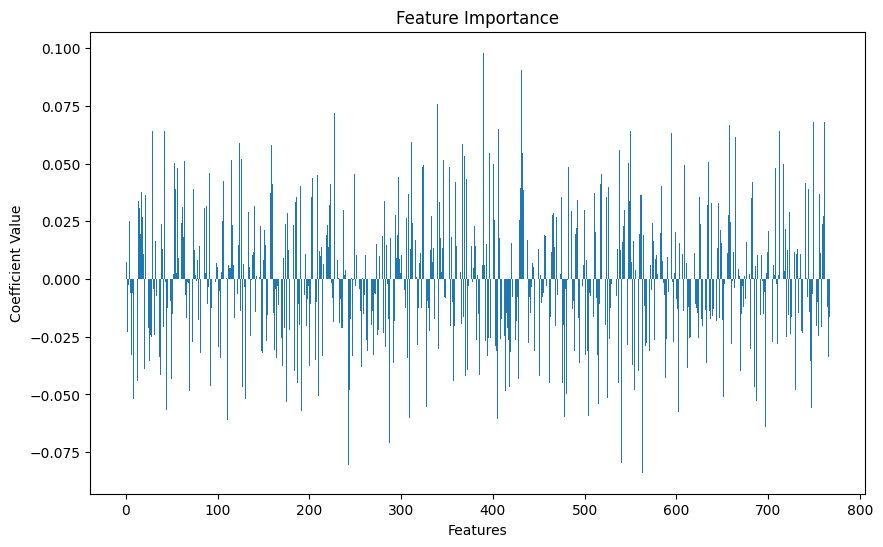

In [50]:
plt.figure(figsize=(10, 6))
plt.bar(range(len(clf.coef_[0])), clf.coef_[0])
plt.xlabel('Features')
plt.ylabel('Coefficient Value')
plt.title('Feature Importance')
plt.show()

In [ ]:
from sklearn.decomposition import PCA

X = np.array([(np.array([1]) + act.detach().cpu().numpy()).mean(axis=0) for act in activations_post])
y = np.array(labels)

# Project data to 2D using PCA
pca = PCA(n_components=2)
X_r = pca.fit_transform(X)

# Fit logistic regression on the 2D projected data
clf_2d = LogisticRegression()
clf_2d.fit(X_r, y)

# Create a mesh to plot the decision boundary
x_min, x_max = X_r[:, 0].min() - .5, X_r[:, 0].max() + .5
y_min, y_max = X_r[:, 1].min() - .5, X_r[:, 1].max() + .5
h = .02  # step size in the mesh
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = clf_2d.predict(np.c_[xx.ravel(), yy.ravel()])

# Plot decision boundary and data points
Z = Z.reshape(xx.shape)
plt.contourf(xx, yy, Z, alpha=0.8)
plt.scatter(X_r[:, 0], X_r[:, 1], c=y, edgecolors='k', cmap=plt.cm.Paired)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('2D PCA Projection and Decision Boundary')
plt.show()


In [11]:
print_layer_names(activations1)

wte
wpe
drop
h.0.ln_1
h.0.attn.c_attn
h.0.attn.attn_dropout
h.0.attn.c_proj
h.0.attn.resid_dropout
h.0.attn
h.0.ln_2
h.0.mlp.c_fc
h.0.mlp.act
h.0.mlp.c_proj
h.0.mlp.dropout
h.0.mlp
h.0
h.1.ln_1
h.1.attn.c_attn
h.1.attn.attn_dropout
h.1.attn.c_proj
h.1.attn.resid_dropout
h.1.attn
h.1.ln_2
h.1.mlp.c_fc
h.1.mlp.act
h.1.mlp.c_proj
h.1.mlp.dropout
h.1.mlp
h.1
h.2.ln_1
h.2.attn.c_attn
h.2.attn.attn_dropout
h.2.attn.c_proj
h.2.attn.resid_dropout
h.2.attn
h.2.ln_2
h.2.mlp.c_fc
h.2.mlp.act
h.2.mlp.c_proj
h.2.mlp.dropout
h.2.mlp
h.2
h.3.ln_1
h.3.attn.c_attn
h.3.attn.attn_dropout
h.3.attn.c_proj
h.3.attn.resid_dropout
h.3.attn
h.3.ln_2
h.3.mlp.c_fc
h.3.mlp.act
h.3.mlp.c_proj
h.3.mlp.dropout
h.3.mlp
h.3
h.4.ln_1
h.4.attn.c_attn
h.4.attn.attn_dropout
h.4.attn.c_proj
h.4.attn.resid_dropout
h.4.attn
h.4.ln_2
h.4.mlp.c_fc
h.4.mlp.act
h.4.mlp.c_proj
h.4.mlp.dropout
h.4.mlp
h.4
h.5.ln_1
h.5.attn.c_attn
h.5.attn.attn_dropout
h.5.attn.c_proj
h.5.attn.resid_dropout
h.5.attn
h.5.ln_2
h.5.mlp.c_fc
h.5.mlp.ac

''

    wte: Word Token Embeddings - The embedding matrix for input tokens.
    wpe: Word Position Embeddings - The embedding matrix for the position of tokens in the sequence.
    drop: Dropout - A regularization layer that randomly sets input units to 0 at each update during training time to prevent overfitting.
    h: Indicates a layer of the transformer. The number following h denotes the index of the layer within the model (e.g., h.0 is the first layer, h.1 is the second layer, and so on).
    ln_1, ln_2: Layer Normalization - Normalizes the input layer by re-centering and re-scaling, often used before or after the self-attention and feed-forward components in transformer blocks.
    attn: Attention - The self-attention mechanism of the transformer. This component helps the model to focus on different parts of the input sequence when making predictions.
        c_attn: Creates the query, key, and value projections for the attention mechanism.
        attn_dropout: Dropout applied to the attention scores.
        c_proj: Projects the output of the attention mechanism back to the hidden size dimensions.
        resid_dropout: Dropout applied to the residual connection (often added after the attention output and before layer normalization).
    mlp: Multi-Layer Perceptron - A small feed-forward neural network that follows the attention mechanism in each transformer block. It usually consists of two linear layers with an activation in between.
        c_fc: The first linear layer (fully connected) of the MLP.
        act: The activation function of the MLP (e.g., GELU or ReLU).
        c_proj: The second linear layer of the MLP.
        dropout: Dropout applied within the MLP to prevent overfitting.
    ln_f: Final Layer Normalization - The layer normalization applied after the last transformer block, before the final output layer.

### Guide for Interpreting the Graphs 
- The relative position of blue and red dots indicates how similar or different the activations are before and after finetuning. If they overlap significantly, the representations are relatively stable through finetuning. If they are separate, it suggests that finetuning has significantly shifted the activations.
- The shift from blue to red dots indicates the direction of change in the hidden states due to finetuning. For instance, if the red dots are predominantly to the right of the blue dots, this indicates that the activations have shifted along the direction represented by PCA Component 1.
- Any consistent pattern of shift (e.g., most red dots are in a specific quadrant relative to the blue dots) may suggest how finetuning has affected the internal representations of the neural network. Perhaps the finetuning has made the network more sensitive to certain features, or has made it focus on different aspects of the input data.

(92, 768)


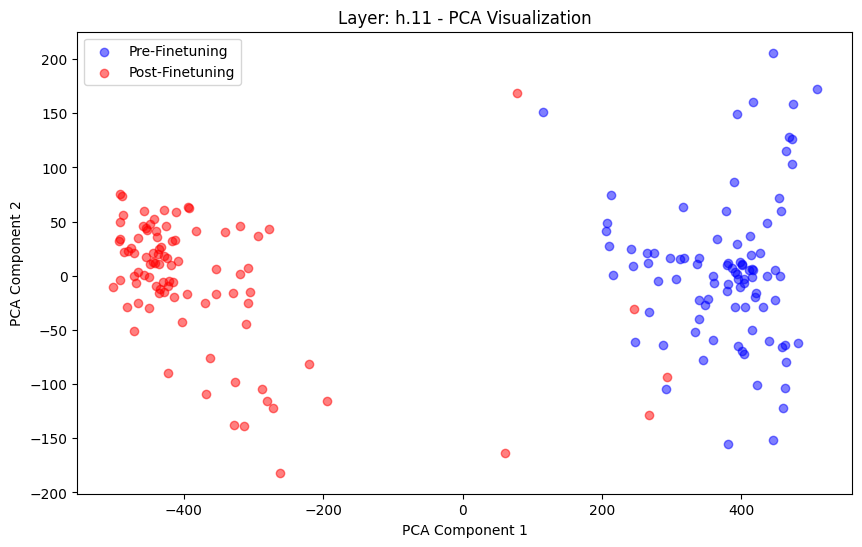

In [24]:
plot_activation_changes(activations1, activations2, 'h.11', method='PCA')

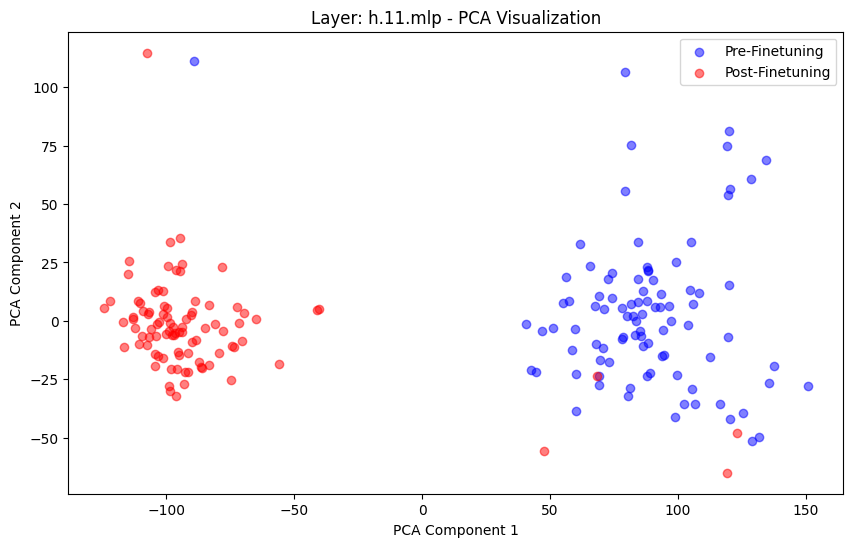

In [35]:
plot_activation_changes(activations1, activations2, 'h.11.mlp', method='PCA')

(92, 768)


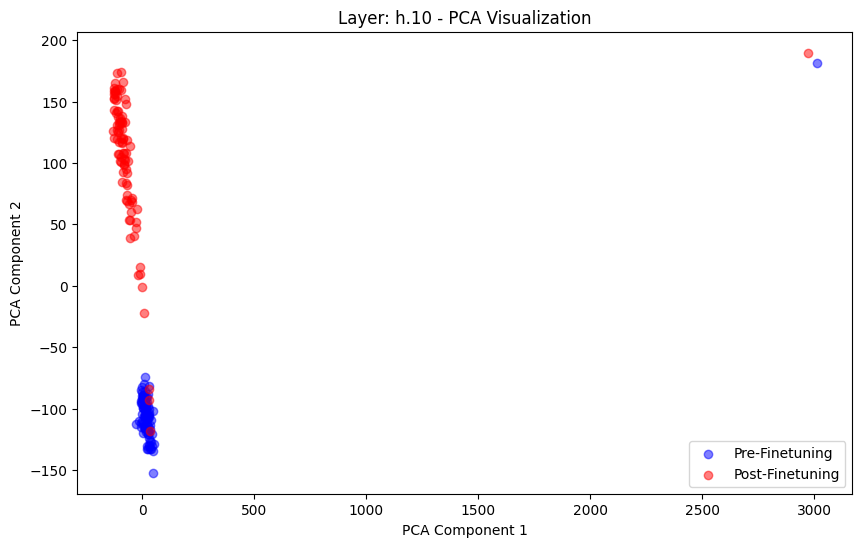

In [36]:
plot_activation_changes(activations1, activations2, 'h.10', method='PCA')

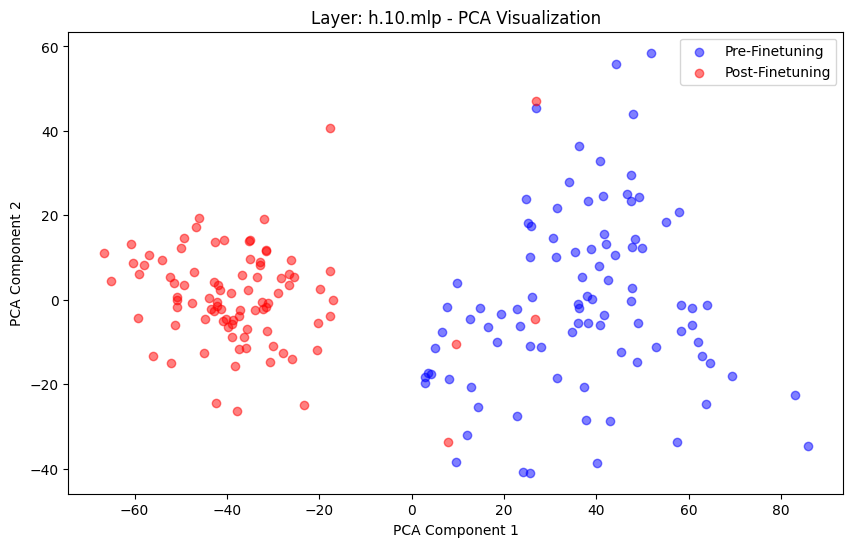

In [37]:
plot_activation_changes(activations1, activations2, 'h.10.mlp', method='PCA')

(92, 768)


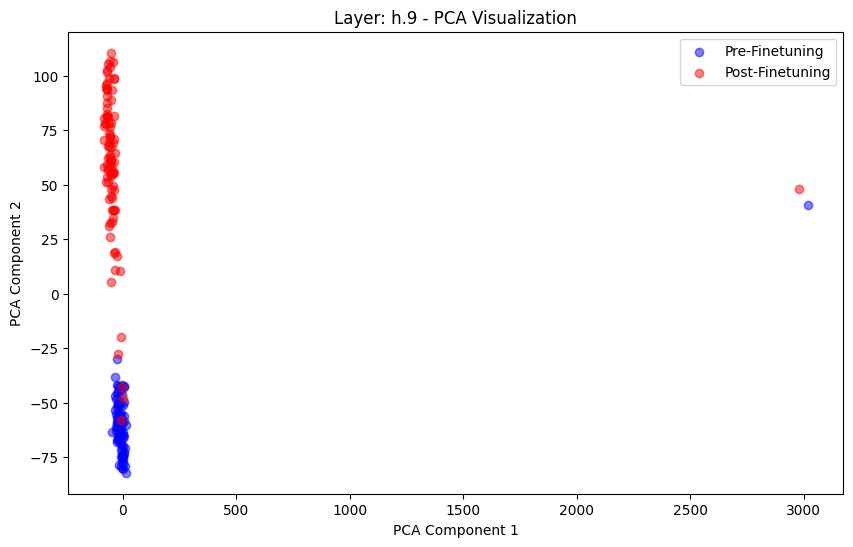

In [26]:
plot_activation_changes(activations1, activations2, 'h.9', method='PCA')

(92, 768)


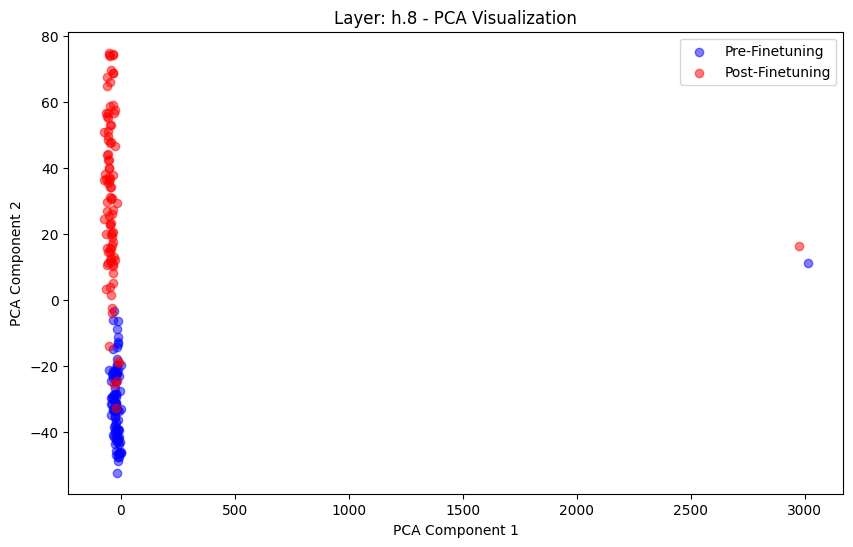

In [27]:
plot_activation_changes(activations1, activations2, 'h.8', method='PCA')

(92, 768)


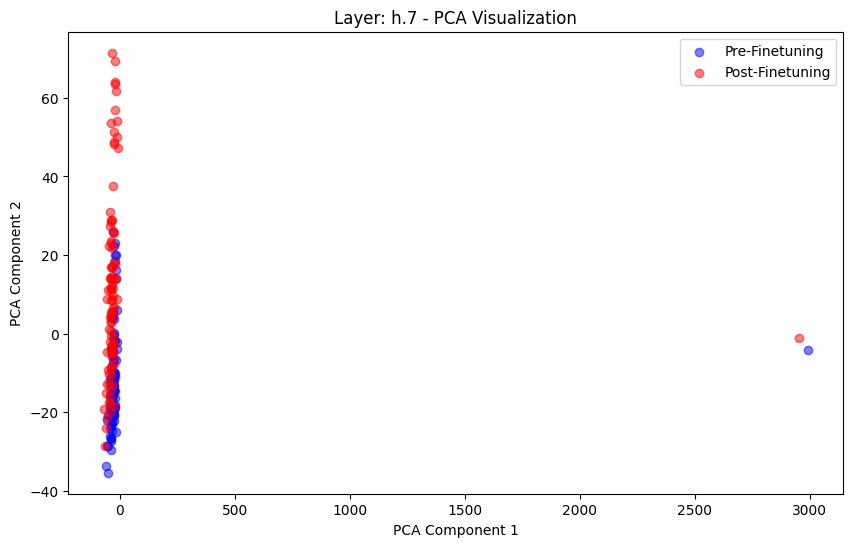

In [28]:
plot_activation_changes(activations1, activations2, 'h.7', method='PCA')

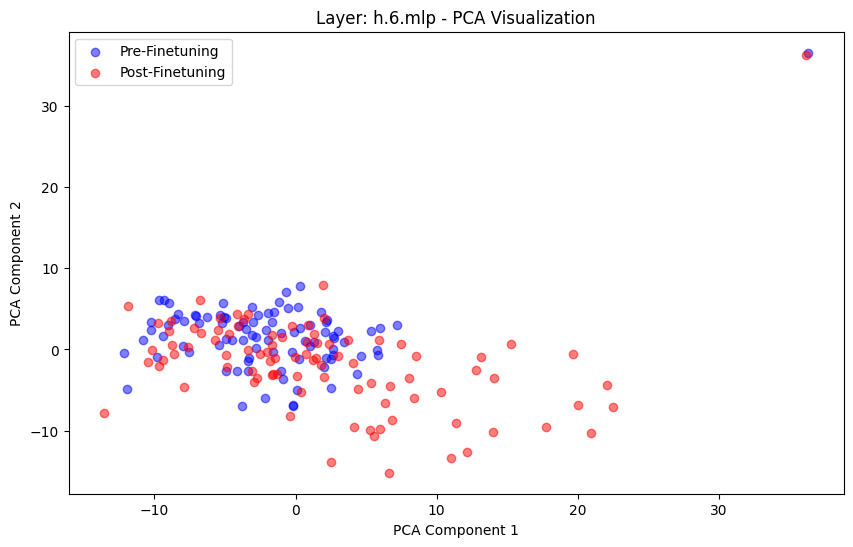

In [30]:
plot_activation_changes(activations1, activations2, 'h.6.mlp', method='PCA')

(92, 768)


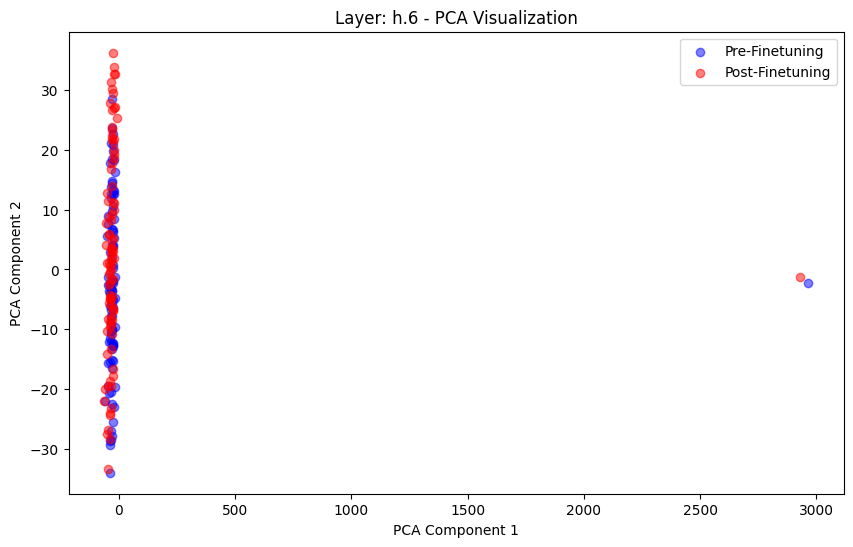

In [38]:
plot_activation_changes(activations1, activations2, 'h.6', method='PCA')

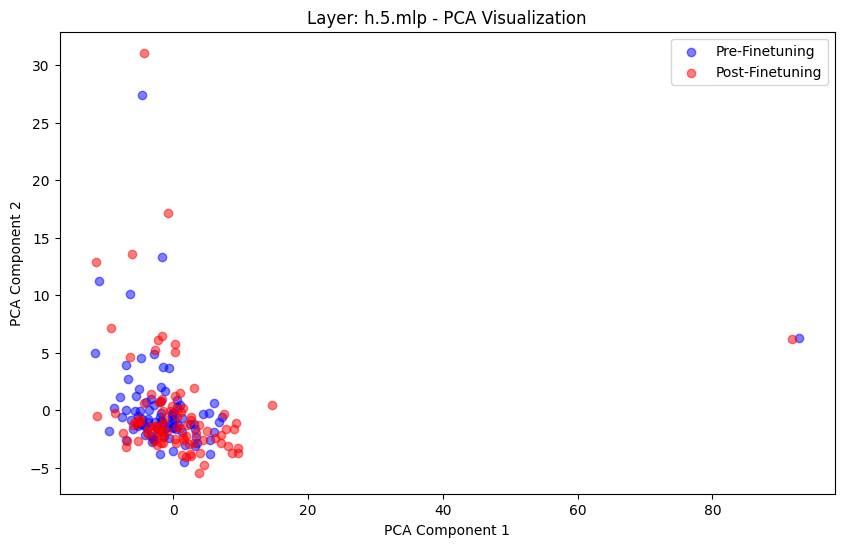

In [21]:
plot_activation_changes(activations1, activations2, 'h.5.mlp', method='PCA')

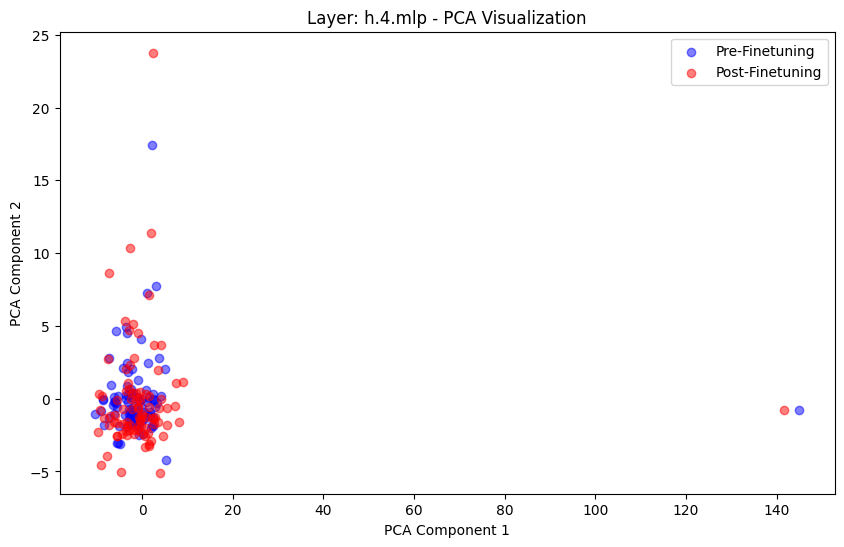

In [20]:
plot_activation_changes(activations1, activations2, 'h.4.mlp', method='PCA')

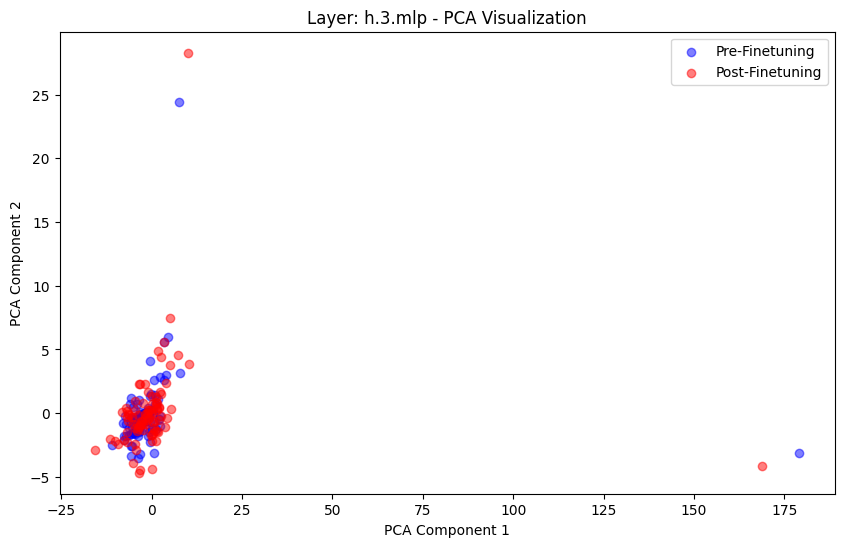

In [19]:
plot_activation_changes(activations1, activations2, 'h.3.mlp', method='PCA')

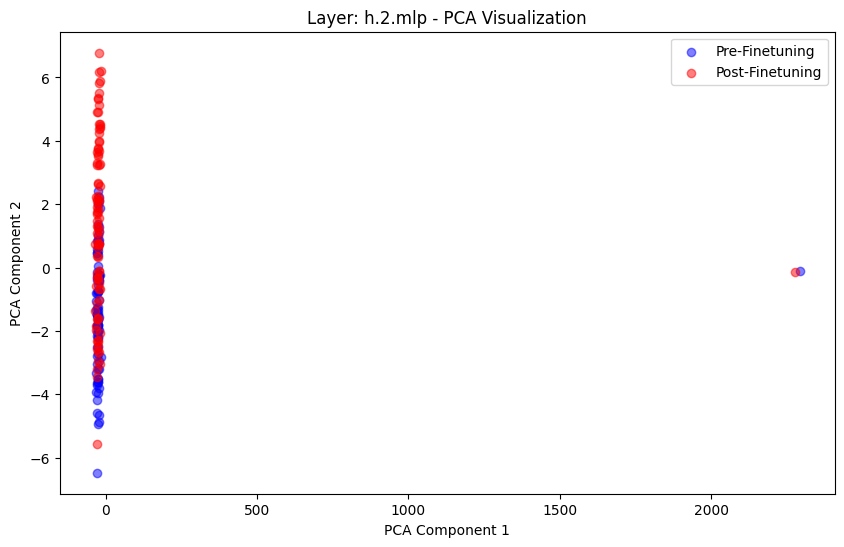

In [18]:
plot_activation_changes(activations1, activations2, 'h.2.mlp', method='PCA')

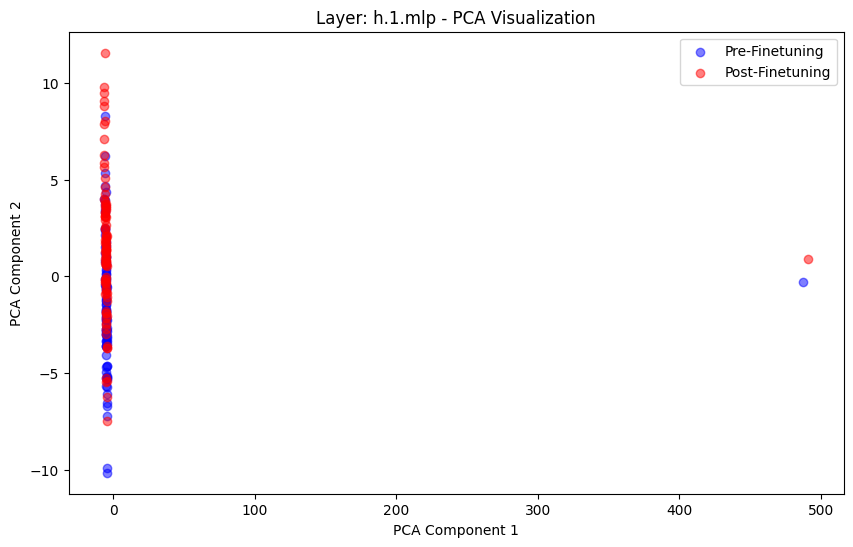

In [17]:
plot_activation_changes(activations1, activations2, 'h.1.mlp', method='PCA')

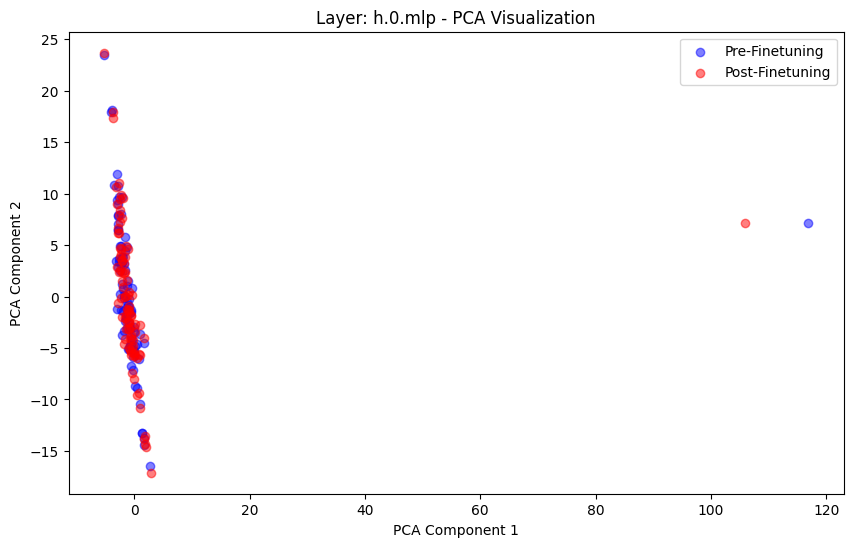

In [14]:
plot_activation_changes(activations1, activations2, 'h.0.mlp', method='PCA')

In [ ]:
plot_activation_changes(activations1, activations2, 'h.0.mlp', method='PCA')

# Legacy: Weight Changes

In [10]:
def extract_model_weights(model):
    weights = []
    # Iterate through each block in the GPT-2 transformer
    for block in model.transformer.h:
        # Each block has two main components: the attention mechanism and the MLP
        # Extract weights from attention mechanism's query, key, value matrices
        attn = block.attn
        weights.append(attn.query.weight.data)
        weights.append(attn.key.weight.data)
        weights.append(attn.value.weight.data)
        weights.append(attn.out.weight.data)
        
        # Extract weights from MLP
        mlp = block.mlp
        weights.append(mlp.c_fc.weight.data)
        weights.append(mlp.c_proj.weight.data)
    return weights

weights_pre = pre_model.score.weight.detach().numpy()
weights_post = post_model.score.weight.detach().numpy()


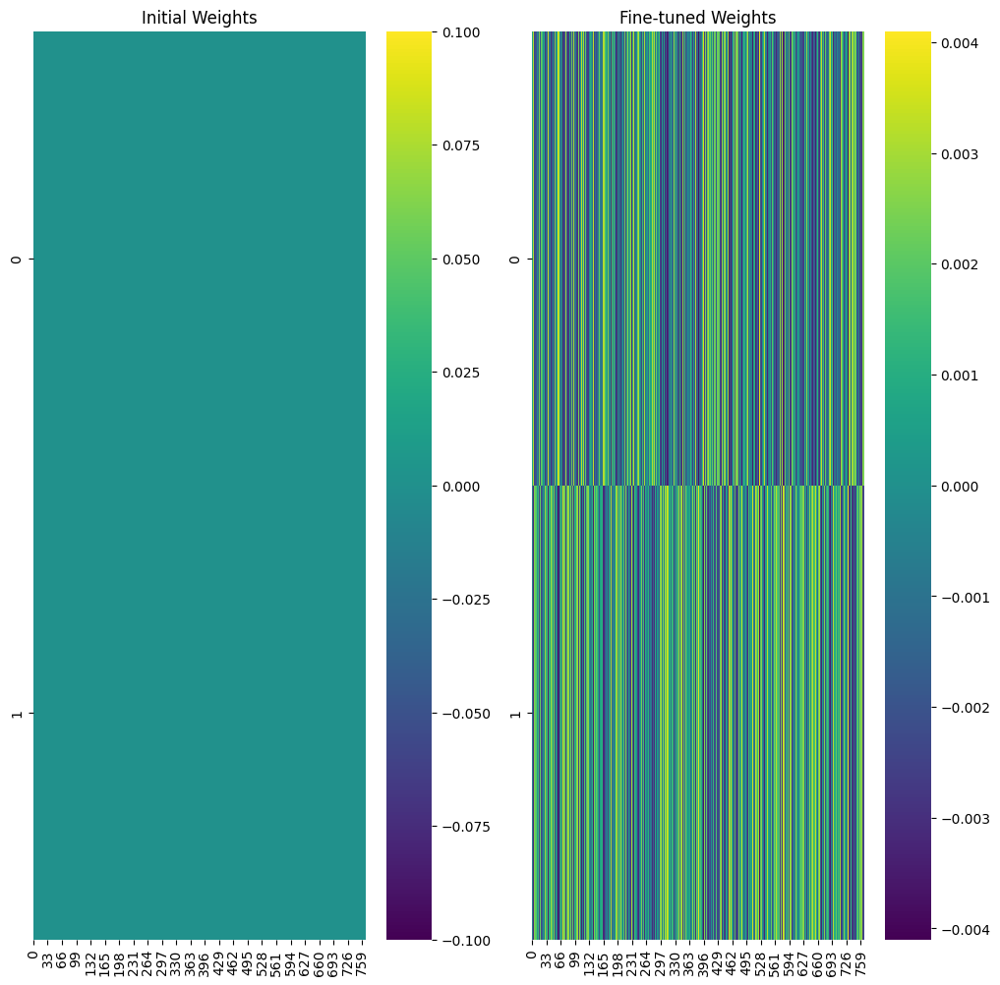

RuntimeError: No mappable was found to use for colorbar creation. First define a mappable such as an image (with imshow) or a contour set (with contourf).

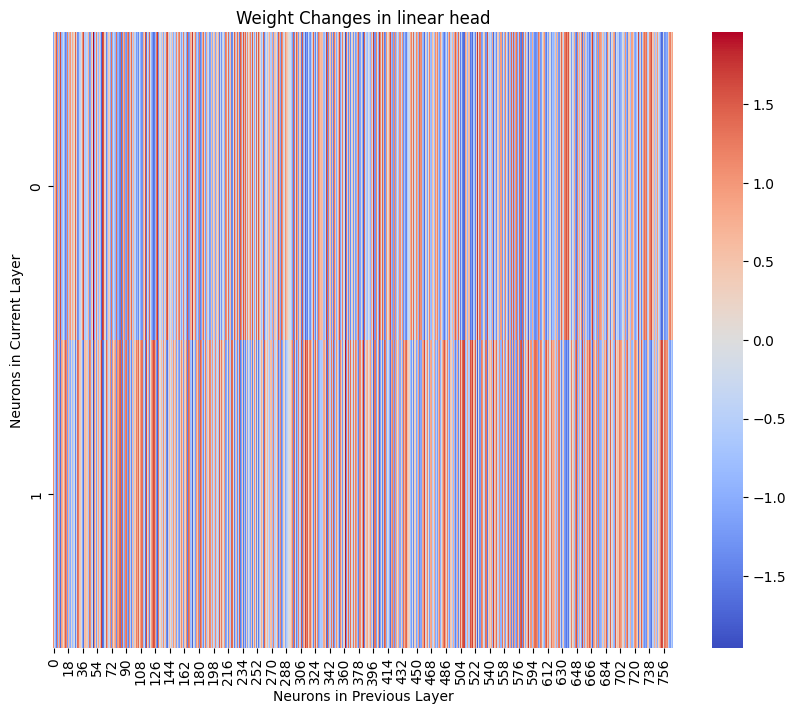

In [30]:
def visualize_weights(initial_weights, finetuned_weights):
    fig, axs = plt.subplots(1, 2, figsize=(12, 12))
    sns.heatmap(initial_weights, ax=axs[0], cmap='viridis')
    axs[0].set_title('Initial Weights')
    sns.heatmap(finetuned_weights, ax=axs[1], cmap='viridis')
    axs[1].set_title('Fine-tuned Weights')
    plt.show()
    
visualize_weights(weights_pre, weights_post)
visualize_weight_changes(weights_pre, weights_post, "linear head")

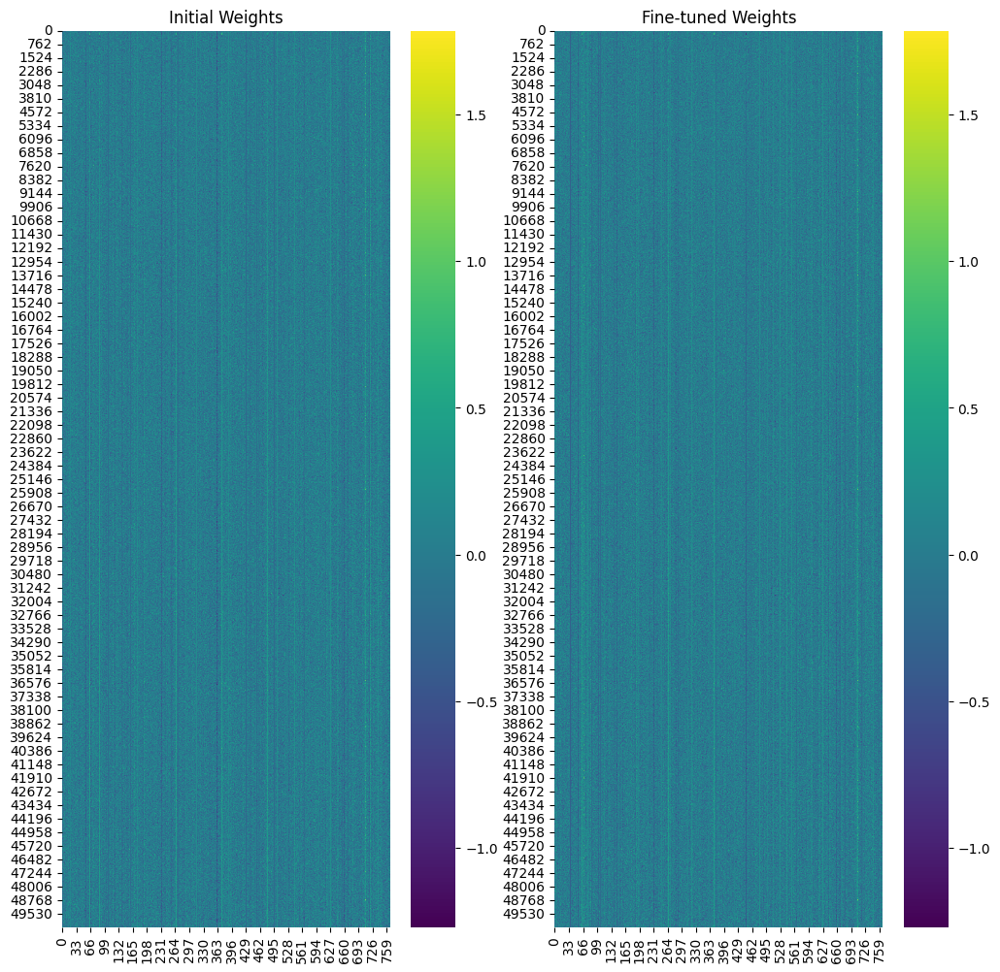

RuntimeError: No mappable was found to use for colorbar creation. First define a mappable such as an image (with imshow) or a contour set (with contourf).

In [ ]:
original_weights = pre_model.transformer.wte.weight.detach().numpy()  # Example: word embedding layer
finetuned_weights = post_model.transformer.wte.weight.detach().numpy()

visualize_weights(original_weights, finetuned_weights)
visualize_weight_changes(original_weights, finetuned_weights, "word embedding")

In [ ]:
original_weights = pre_model.transformer.wte.weight.detach().numpy()  # Example: word embedding layer
finetuned_weights = post_model.transformer.wte.weight.detach().numpy()

visualize_weights(original_weights, finetuned_weights)

In [ ]:
original_query_weights = original_model.transformer.h[0].attn.c_attn.weight.detach().numpy()
original_key_weightsb = original_model.transformer.h[0].attn.c_attn.weight.detach().numpy()
original_value_weights = original_model.transformer.h[0].attn.c_attn.weight.detach().numpy()


In [28]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def visualize_weight_changes(initial_weights, finetuned_weights, layer_name):
    # Calculate the absolute differences between the weights
    weight_differences = finetuned_weights - initial_weights
    
    # Normalize the differences to have a better visual comparison
    # This is optional and can be commented out if raw differences are preferred
    weight_differences = weight_differences / np.std(weight_differences)
    
    # Visualize the differences using a heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(weight_differences, cmap='coolwarm', center=0)
    plt.title(f'Weight Changes in {layer_name}')
    plt.xlabel('Neurons in Previous Layer')
    plt.ylabel('Neurons in Current Layer')
    plt.colorbar(label='Magnitude of Weight Change')
    plt.show()


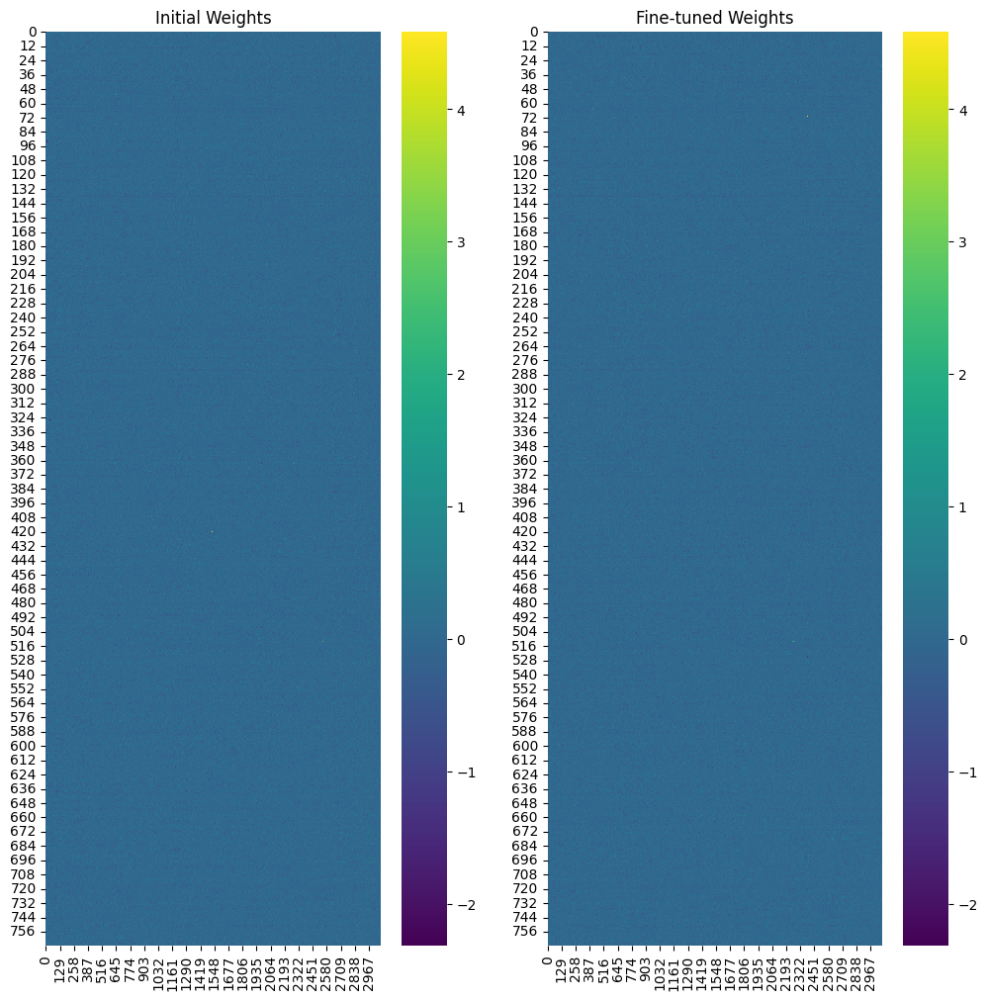

RuntimeError: No mappable was found to use for colorbar creation. First define a mappable such as an image (with imshow) or a contour set (with contourf).

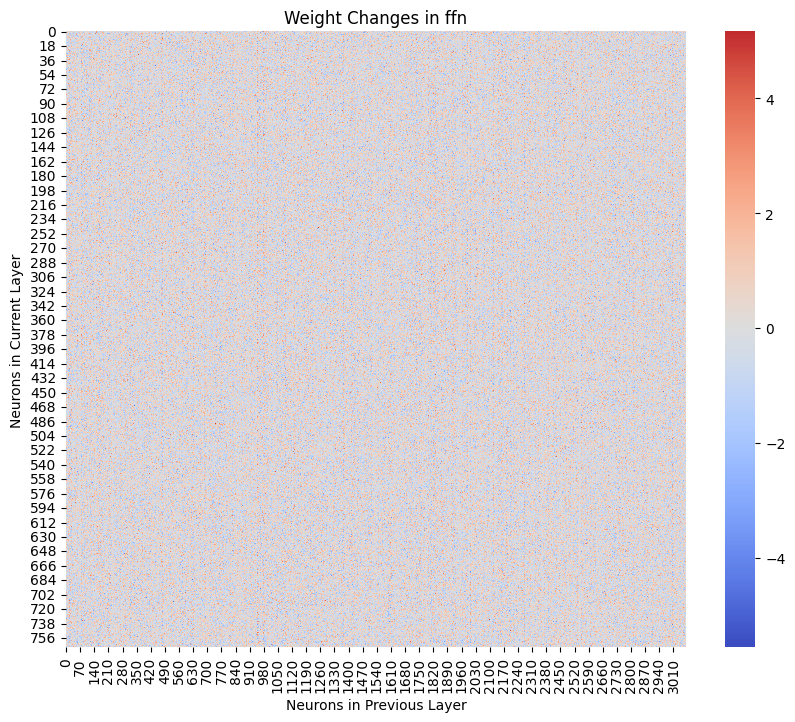

In [29]:
original_ffn_weights = pre_model.transformer.h[0].mlp.c_fc.weight.detach().numpy()
finetuned_ffn_weights = post_model.transformer.h[0].mlp.c_fc.weight.detach().numpy()

visualize_weights(original_ffn_weights, finetuned_ffn_weights)
visualize_weight_changes(original_ffn_weights, finetuned_ffn_weights, "ffn")

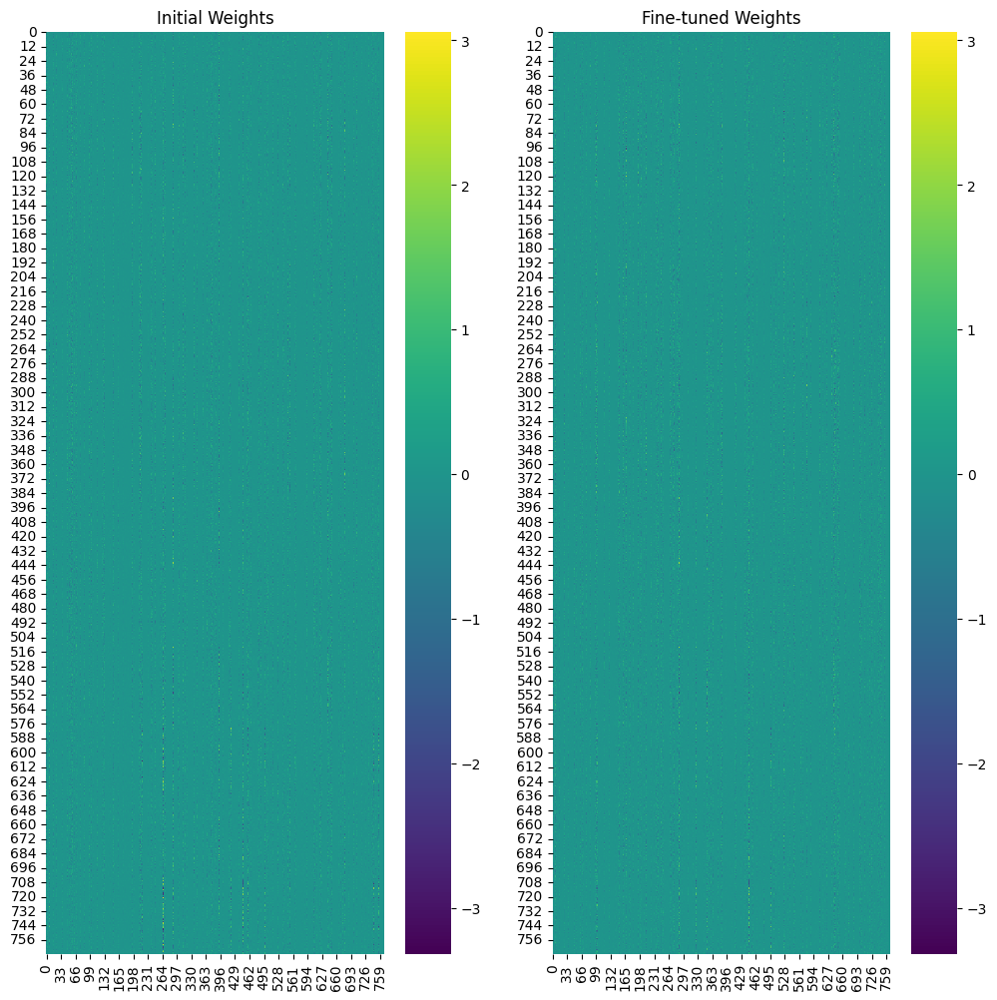

In [27]:
original_weights = pre_model.transformer.h[0].attn.c_proj.weight.detach().numpy()
finetuned_weights = post_model.transformer.h[0].attn.c_proj.weight.detach().numpy()

visualize_weights(original_weights, finetuned_weights)

In [20]:
tensors

{'lm.transformer.h.0.attn.c_attn.bias': tensor([ 0.4812, -0.5249, -0.4288,  ...,  0.0136, -0.0503,  0.0027],
        device='cuda:0'),
 'lm.transformer.h.0.attn.c_attn.weight': tensor([[-0.4725, -0.2611, -0.0985,  ...,  0.0520, -0.0592,  0.0260],
         [ 0.0867,  0.1466,  0.2390,  ..., -0.0545, -0.0112, -0.0151],
         [ 0.0043,  0.0710,  0.3678,  ...,  0.1136,  0.0359, -0.0325],
         ...,
         [-0.2587, -0.0165,  0.1987,  ...,  0.0085, -0.0513,  0.0317],
         [ 0.1506,  0.2172,  0.1037,  ...,  0.0290, -0.0426, -0.0465],
         [-0.4106, -0.1919, -0.2388,  ..., -0.0036,  0.0083,  0.0210]],
        device='cuda:0'),
 'lm.transformer.h.0.attn.c_proj.bias': tensor([ 1.5024e-01, -1.5370e-01, -1.4688e-01, -9.9364e-02,  3.4569e-02,
         -3.4644e-02, -7.0443e-02, -9.3438e-02,  8.1596e-02,  3.1345e-02,
         -1.9869e-01, -3.6759e-02,  3.0135e-03,  5.0143e-02, -5.2860e-02,
          3.7432e-02, -1.9000e-01, -8.1408e-02,  4.9246e-02,  1.4260e-01,
         -1.1226e-01, 

In [27]:
post_model = TransformerWithHead.from_pretrained(model_name)